<a href="https://colab.research.google.com/github/ruby-ann-y-matias/ml-playground/blob/main/boston_exploratory_data_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

Authenticated


In [2]:
%%bigquery --project expensify-e0b56 boston_df
WITH boston_df_temp AS (
  SELECT
    int64_field_0, crim, zn, indus, chas, nox, rm, age, dis, rad, tax, ptratio, black, lstat, medv,
    ROW_NUMBER() OVER (PARTITION BY int64_field_0)
  FROM `boston_dataset.boston_table`
)
SELECT * FROM boston_df_temp

In [3]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [4]:
import pandas as pd
import pandas_profiling

In [5]:
from pandas_profiling import ProfileReport
#boston_df.describe()
profile_result = ProfileReport(boston_df)

In [6]:
profile_result

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
rejected_vars = profile_result.get_rejected_variables

In [8]:
boston_df.drop(rejected_vars(), axis=1, inplace=True)

In [9]:
from sklearn.preprocessing import minmax_scale

In [10]:
dataset = pd.DataFrame(minmax_scale(boston_df), columns=boston_df.columns)

In [11]:
from sklearn.preprocessing import Normalizer

In [12]:
dataset = pd.DataFrame(Normalizer().fit(dataset).transform(dataset), columns=dataset.columns)

In [13]:
import matplotlib.pyplot as plt

In [15]:
%matplotlib inline

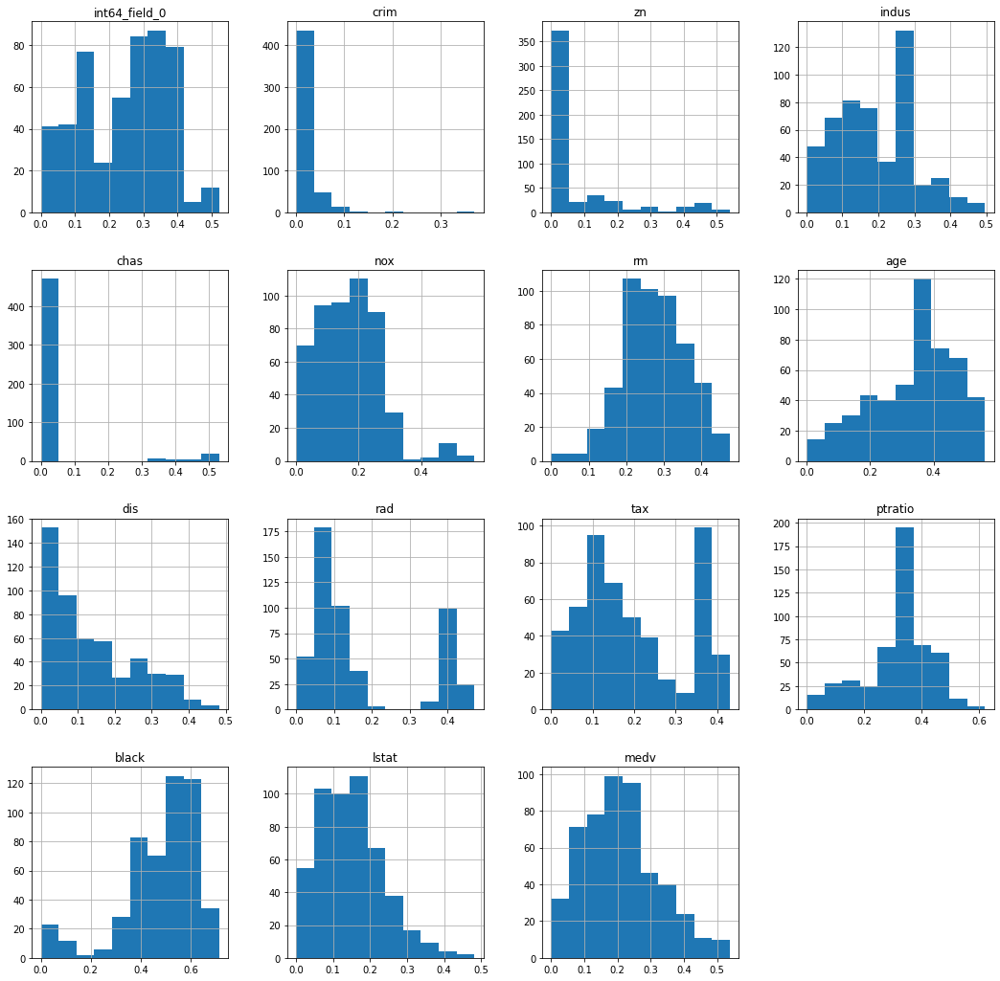

In [18]:
dataset.hist(figsize=(18,18))
plt.show()

In [22]:
#split features and labels
dataset_y = dataset['black']
dataset_x = dataset.drop(['black', 'int64_field_0'], axis=1)

In [23]:
from sklearn.model_selection import train_test_split

In [24]:
x_train, x_test, y_train, y_test = train_test_split(dataset_x, dataset_y, shuffle=True)

In [25]:
#spotcheck ML algorithms
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from math import sqrt

In [26]:
#create a dictionary of the candidate algorithms
ml_models = {
    'Linear Reg.': LinearRegression(),
    'Dec. Trees': DecisionTreeRegressor(),
    'Rand. Forest': RandomForestRegressor(),
    'SVM': SVR(),
    'XGBoost': XGBRegressor(),
    'NNets': MLPRegressor(warm_start=True, early_stopping=True, learning_rate='adaptive')
}

In [28]:
#for each algorithm, train with the training set and evaluate on the hold-out test set
ml_results = {}

for name, model in ml_models.items():
  #fit model on training data
  model.fit(x_train, y_train)
  #make prediction for test data
  prediction = model.predict(x_test)
  #evaluate predictions
  rmse = sqrt(mean_squared_error(y_test, prediction))
  #append accuracy results to dictionary
  ml_results[name] = rmse
  print('RMSE: {} => {}'.format(name, rmse))

RMSE: Linear Reg. => 0.08791575646032891
RMSE: Dec. Trees => 0.07838209233281757
RMSE: Rand. Forest => 0.057160460496044306
RMSE: SVM => 0.0735911827515163
[08:43:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
RMSE: XGBoost => 0.05319246154017214
RMSE: NNets => 0.08975810573958666


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Text(0, 0.5, 'RMSE')

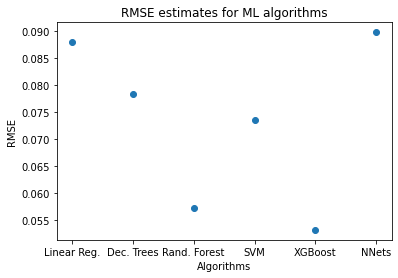

In [43]:
#plots of the model performances
plt.plot(list(ml_results.keys()), list(ml_results.values()), 'o')
plt.title('RMSE estimates for ML algorithms')
plt.xlabel('Algorithms')
plt.ylabel('RMSE')